In [33]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Imputer, StandardScaler
pipeline = Pipeline([("imputer", Imputer(strategy="median",
                                               axis=0)),
                           ("scaler", StandardScaler())])

test_df = pd.read_csv('./data/test_clean.csv')
train_df = pd.read_csv('./data/train_clean.csv')
train_df['price_doc_tr'] = np.log(train_df['price_doc']+1)
train_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota,timestamp,price_doc,id,price_doc_tr
0,43.0,27.0,4.0,NaN,NaN,3,1,NaN,NaN,NaN,...,13.100618,1.107594,23.68346,0,14.27,5001.0,2011-08-20,5850000.0,1,15.581952


In [34]:
test_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,market_shop_km,thermal_power_plant_km,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota,timestamp,id
0,39.0,20.7,2,1998.0,9,396,80,8.9,1.0,3.0,...,5.353674,8.95778,22.790985,11.810839,0.967696,0,20.14,11926.0,7/1/15,30474


In [35]:
pipeline.fit(train_df.ix[:,:-4])

Pipeline(steps=[('imputer', Imputer(axis=0, copy=True, missing_values='NaN', strategy='median', verbose=0)), ('scaler', StandardScaler(copy=True, with_mean=True, with_std=True))])

In [36]:
transformed_train_df = pd.DataFrame(pipeline.transform(train_df.ix[:,:-4]), columns = train_df.columns[:-4])
transformed_train_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,green_part_500,hospital_beds_raion,market_shop_km,thermal_power_plant_km,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota
0,-0.515636,-0.400044,-0.69212,-0.149978,-0.067519,-2.279977,-1.886561,-0.01152,0.090579,-0.092207,...,-0.833368,-1.106626,-0.662114,-0.271564,-0.114599,-1.074617,1.77877,-0.328177,-0.347004,0.946317


In [37]:
transformed_test_df = pd.DataFrame(pipeline.transform(test_df.ix[:,:-2]), columns = test_df.columns[:-2])
transformed_test_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,green_part_500,hospital_beds_raion,market_shop_km,thermal_power_plant_km,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota
0,-0.704761,-0.788155,-1.070112,0.964061,-0.612713,-1.235555,-1.174826,0.390839,-1.358264,1.486239,...,1.797021,-0.136586,0.404583,0.28788,1.046894,1.218388,-1.449627,-0.328177,0.066375,4.544404


In [58]:
final_train_df = pd.concat([transformed_train_df, train_df[['timestamp', 'id', 'price_doc', 'price_doc_tr']]], axis=1)
final_train_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota,timestamp,id,price_doc,price_doc_tr
0,-0.515636,-0.400044,-0.69212,-0.149978,-0.067519,-2.279977,-1.886561,-0.01152,0.090579,-0.092207,...,-0.114599,-1.074617,1.77877,-0.328177,-0.347004,0.946317,2011-08-20,1,5850000.0,15.581952


In [59]:
final_test_df = pd.concat([transformed_test_df, test_df[['timestamp', 'id']]], axis=1)

final_test_df.head(1)

,full_sq,life_sq,floor,build_year,max_floor,month_year_cnt,week_year_cnt,kitch_sq,num_room,state,...,market_shop_km,thermal_power_plant_km,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota,timestamp,id
0,-0.704761,-0.788155,-1.070112,0.964061,-0.612713,-1.235555,-1.174826,0.390839,-1.358264,1.486239,...,0.404583,0.28788,1.046894,1.218388,-1.449627,-0.328177,0.066375,4.544404,7/1/15,30474


In [40]:
final_train_df.to_csv('./data/preprocessed_train.csv')
final_test_df.to_csv('./data/preprocessed_test.csv')

In [86]:
from sklearn import linear_model
from sklearn.grid_search import GridSearchCV
import time
import matplotlib.pyplot as plt
%matplotlib inline

def en_regression(dataframe, target_variable, param, pipeline_in):
    X_train = dataframe.drop(target_variable, axis=1)
    y_train = dataframe[target_variable]

    pipeline = pipeline_in

    parameter_grid = param
    np.random.seed(0)
    grid_search = GridSearchCV(estimator=pipeline,
                               param_grid=parameter_grid,
                               cv=5,
                               verbose=2,
                               n_jobs=1,
                               refit=True)
    return auto_grid(grid_search, X_train, y_train, 'EN')
    
def auto_grid(grid_search, X_train, y_train, model_str):
    grid_search.fit(X_train, y_train)
    print '\n All grid results: \n'
    print grid_search.grid_scores_
    custom_out('Best score {}: {}'.format(model_str, grid_search.best_score_))
    custom_out('Best parameters {}: {}'.format(model_str, grid_search.best_params_))
    plt.scatter(grid_search.best_estimator_.predict(X_train), y_train)
    plt.show()
    return grid_search.best_estimator_

def custom_out(my_str):
    print '\n{}: {}\n'.format(time.strftime("%Y%m%d-%H%M%S"), my_str)
    return

In [67]:
param_grid = {'en__alpha': [0.5, 1.0, 2], 'en__l1_ratio': [0.02,0.5,0.98]}
pipeline_in=Pipeline([("en", linear_model.ElasticNet())])
en_model = en_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = en_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] en__l1_ratio=0.02, en__alpha=0.5 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.5 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.5 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.5 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.5 ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ....................... en__l1_ratio=0.02, en__alpha=0.5 -   0.1s
[CV] en__l1_ratio=0.5, en__alpha=0.5 .................................
[CV] ........................ en__l1_ratio=0.5, en__alpha=0.5 -   0.0s
[CV] en__l1_ratio=0.5, en__alpha=0.5 .................................
[CV] ........................ en__l1_ratio=0.5, en__alpha=0.5 -   0.0s
[CV] en__l1_ratio=0.5, en__alpha=0.5 .................................
[CV] ........................ en__l1_ratio=0.5, en__alpha=0.5 -   0.0s
[CV] en__l1_ratio=0.98, en__alpha=0.5 ................................
[CV] ....................... en__l1_ratio=0.98, en__alpha=0.5 -   0.0s
[CV] en__l1_ratio=0.98, en__alpha=0.5 ................................
[CV] ....................... en__l1_ratio=0.98, en__alpha=0.5 -   0.1s
[CV] en__l1_ratio=0.98, en__alpha=0.5 ................................
[CV] ....................... en__l1_ratio=0.98, en__alpha=0.5 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=1.0 ................................
[CV] .

[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    1.7s finished


Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] en__l1_ratio=0.01, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.01, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.01, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.01, en__alpha=0.4 -   0.2s
[CV] en__l1_ratio=0.01, en__alpha=0.4 ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ....................... en__l1_ratio=0.01, en__alpha=0.4 -   0.2s
[CV] en__l1_ratio=0.01, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.01, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.01, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.01, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.4 -   0.1s
[CV] en__l1_ratio=0.02, en__alpha=0.4 ................................
[CV] ....................... en__l1_ratio=0.02, en__alpha=0.4 -   0.2s
[CV] en__l1_ratio=0.02, en__alpha=0.4 ................................
[CV] .

[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    6.6s finished


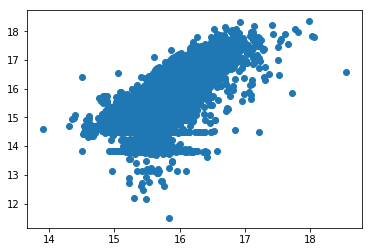

In [91]:
param_grid = {'en__alpha': [0.4, 0.5, 0.6], 'en__l1_ratio': [0.01,0.02,0.04, 0.08]}
pipeline_in=Pipeline([("en", linear_model.ElasticNet())])
en_model = en_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = en_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

# We should try ridge regression, since Lasso coef -> 0

In [87]:
from sklearn import linear_model
def ridge_regression(dataframe, target_variable, param, pipeline_in):
    X_train = dataframe.drop(target_variable, axis=1)
    y_train = dataframe[target_variable]

    pipeline = pipeline_in

    parameter_grid = param
    np.random.seed(0)
    grid_search = GridSearchCV(estimator=pipeline,
                               param_grid=parameter_grid,
                               cv=5,
                               verbose=2,
                               n_jobs=1,
                               refit=True)
    return auto_grid(grid_search, X_train, y_train, 'ridge')

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] ridge__alpha=0.01, ridge__solver=svd ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=svd -   0.1s
[CV] ridge__alpha=0.01, ridge__solver=svd ............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ................... ridge__alpha=0.01, ridge__solver=svd -   0.1s
[CV] ridge__alpha=0.01, ridge__solver=svd ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=svd -   0.1s
[CV] ridge__alpha=0.01, ridge__solver=svd ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=svd -   0.1s
[CV] ridge__alpha=0.01, ridge__solver=svd ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=svd -   0.1s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.5s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.4s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.4s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] .

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   10.4s finished



 All grid results: 

[mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 0.01, 'ridge__solver': 'svd'}, mean: 0.32672, std: 0.07942, params: {'ridge__alpha': 0.01, 'ridge__solver': 'sag'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 0.01, 'ridge__solver': 'auto'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 0.1, 'ridge__solver': 'svd'}, mean: 0.32675, std: 0.07944, params: {'ridge__alpha': 0.1, 'ridge__solver': 'sag'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 0.1, 'ridge__solver': 'auto'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 1, 'ridge__solver': 'svd'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 1, 'ridge__solver': 'sag'}, mean: 0.32674, std: 0.07944, params: {'ridge__alpha': 1, 'ridge__solver': 'auto'}]

20170527-141013: Best score ridge: 0.326754547446


20170527-141013: Best parameters ridge: {'ridge__alpha': 0.1, 'ridge__solver': 'sag'}



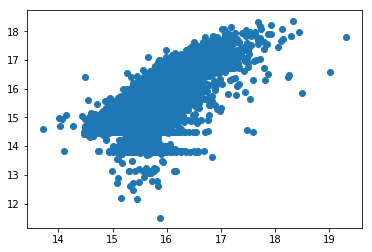

In [88]:
param_grid = {'ridge__alpha': [0.01, 0.1, 1],
             'ridge__solver': ['svd', 'sag', 'auto']}
pipeline_in=Pipeline([("ridge", linear_model.Ridge())])
ridge_model = ridge_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] ridge__alpha=0.005, ridge__solver=sag ...........................
[CV] .................. ridge__alpha=0.005, ridge__solver=sag -   0.4s
[CV] ridge__alpha=0.005, ridge__solver=sag ...........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] .................. ridge__alpha=0.005, ridge__solver=sag -   0.4s
[CV] ridge__alpha=0.005, ridge__solver=sag ...........................
[CV] .................. ridge__alpha=0.005, ridge__solver=sag -   0.5s
[CV] ridge__alpha=0.005, ridge__solver=sag ...........................
[CV] .................. ridge__alpha=0.005, ridge__solver=sag -   0.6s
[CV] ridge__alpha=0.005, ridge__solver=sag ...........................
[CV] .................. ridge__alpha=0.005, ridge__solver=sag -   0.5s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.6s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.7s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -   0.6s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] .

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   15.0s finished



 All grid results: 

[mean: 0.32672, std: 0.07942, params: {'ridge__alpha': 0.005, 'ridge__solver': 'sag'}, mean: 0.32675, std: 0.07944, params: {'ridge__alpha': 0.01, 'ridge__solver': 'sag'}, mean: 0.32673, std: 0.07944, params: {'ridge__alpha': 0.02, 'ridge__solver': 'sag'}, mean: 0.32669, std: 0.07949, params: {'ridge__alpha': 0.04, 'ridge__solver': 'sag'}, mean: 0.32672, std: 0.07942, params: {'ridge__alpha': 0.08, 'ridge__solver': 'sag'}, mean: 0.32673, std: 0.07944, params: {'ridge__alpha': 0.16, 'ridge__solver': 'sag'}]

20170527-141036: Best score ridge: 0.326754430243


20170527-141036: Best parameters ridge: {'ridge__alpha': 0.01, 'ridge__solver': 'sag'}



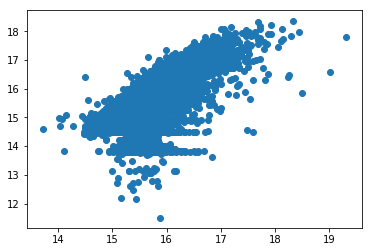

In [89]:
param_grid = {'ridge__alpha': [0.005, 0.01, 0.02, 0.04, 0.08, 0.16],
             'ridge__solver': ['sag']}
pipeline_in=Pipeline([("ridge", linear_model.Ridge())])
ridge_model = ridge_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

# Shown above: EN (0.2758) < Ridge (0.3268)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=False .....................................
[CV] ............................ linreg__fit_intercept=False -   0.1s
[CV] linreg__fit_intercept=False .....................................
[CV] ............................ linreg__fit_intercept=False -   0.1s
[CV] linreg__fit_intercept=False .....................................
[CV] ............................ linreg__fit_intercept=False -   0.1s
[CV] linreg__fit_intercept=False .....................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished


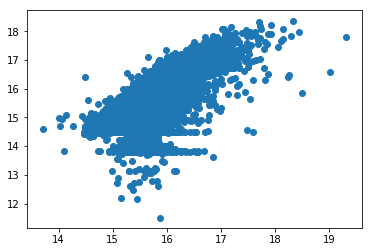

In [92]:
param_grid = {'linreg__fit_intercept': [True, False]}
pipeline_in=Pipeline([("linreg", linear_model.LinearRegression())])
ridge_model = ridge_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

# Shown above: Standard LR equivalent to Ridge and Huber

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] huber__alpha=0.0001, huber__epsilon=1 ...........................
[CV] .................. huber__alpha=0.0001, huber__epsilon=1 -   1.1s
[CV] huber__alpha=0.0001, huber__epsilon=1 ...........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s remaining:    0.0s


[CV] .................. huber__alpha=0.0001, huber__epsilon=1 -   1.3s
[CV] huber__alpha=0.0001, huber__epsilon=1 ...........................
[CV] .................. huber__alpha=0.0001, huber__epsilon=1 -   1.2s
[CV] huber__alpha=0.0001, huber__epsilon=1 ...........................
[CV] .................. huber__alpha=0.0001, huber__epsilon=1 -   1.2s
[CV] huber__alpha=0.0001, huber__epsilon=1 ...........................
[CV] .................. huber__alpha=0.0001, huber__epsilon=1 -   1.5s
[CV] huber__alpha=0.0001, huber__epsilon=1.5 .........................
[CV] ................ huber__alpha=0.0001, huber__epsilon=1.5 -   1.3s
[CV] huber__alpha=0.0001, huber__epsilon=1.5 .........................
[CV] ................ huber__alpha=0.0001, huber__epsilon=1.5 -   1.5s
[CV] huber__alpha=0.0001, huber__epsilon=1.5 .........................
[CV] ................ huber__alpha=0.0001, huber__epsilon=1.5 -   1.8s
[CV] huber__alpha=0.0001, huber__epsilon=1.5 .........................
[CV] .

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  1.7min finished



 All grid results: 

[mean: 0.26945, std: 0.10624, params: {'huber__alpha': 0.0001, 'huber__epsilon': 1}, mean: 0.28284, std: 0.10728, params: {'huber__alpha': 0.0001, 'huber__epsilon': 1.5}, mean: 0.32451, std: 0.08813, params: {'huber__alpha': 0.0001, 'huber__epsilon': 3}, mean: 0.32674, std: 0.07943, params: {'huber__alpha': 0.0001, 'huber__epsilon': 10}, mean: 0.26946, std: 0.10625, params: {'huber__alpha': 0.001, 'huber__epsilon': 1}, mean: 0.28284, std: 0.10728, params: {'huber__alpha': 0.001, 'huber__epsilon': 1.5}, mean: 0.32451, std: 0.08813, params: {'huber__alpha': 0.001, 'huber__epsilon': 3}, mean: 0.32674, std: 0.07943, params: {'huber__alpha': 0.001, 'huber__epsilon': 10}, mean: 0.26947, std: 0.10621, params: {'huber__alpha': 0.01, 'huber__epsilon': 1}, mean: 0.28283, std: 0.10729, params: {'huber__alpha': 0.01, 'huber__epsilon': 1.5}, mean: 0.32452, std: 0.08813, params: {'huber__alpha': 0.01, 'huber__epsilon': 3}, mean: 0.32674, std: 0.07944, params: {'huber__alpha': 0

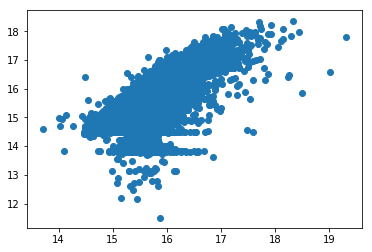

In [90]:
param_grid = {'huber__epsilon': [1, 1.5, 3, 10], 'huber__alpha': [0.0001, 0.001, 0.01, 0.1]}
pipeline_in=Pipeline([("huber", linear_model.HuberRegressor())])
ridge_model = ridge_regression(final_train_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_df.drop(['timestamp', 'id'],axis=1))
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [97]:
macro_df = pd.read_csv('./data/macro_feature_CS_0521.csv')
pipeline = Pipeline([("imputer", Imputer(strategy="median",
                                               axis=0)),
                           ("scaler", StandardScaler())])
for i in macro_df.columns:
    print i

timestamp
oil_urals
gdp_quart
gdp_quart_growth
cpi
ppi
gdp_deflator
balance_trade
balance_trade_growth
usdrub
eurrub
brent
net_capital_export
gdp_annual
gdp_annual_growth
average_provision_of_build_contract
average_provision_of_build_contract_moscow
rts
micex
micex_rgbi_tr
micex_cbi_tr
deposits_value
deposits_growth
deposits_rate
mortgage_value
mortgage_growth
mortgage_rate
grp
grp_growth
income_per_cap
real_dispos_income_per_cap_growth
salary
salary_growth
fixed_basket
retail_trade_turnover
retail_trade_turnover_per_cap
retail_trade_turnover_growth
labor_force
unemployment
employment
invest_fixed_capital_per_cap
invest_fixed_assets
profitable_enterpr_share
unprofitable_enterpr_share
share_own_revenues
overdue_wages_per_cap
fin_res_per_cap
marriages_per_1000_cap
divorce_rate
construction_value
invest_fixed_assets_phys
pop_natural_increase
pop_migration
pop_total_inc
childbirth
mortality
housing_fund_sqm
lodging_sqm_per_cap
water_pipes_share
baths_share
sewerage_share
gas_share
hot_wate

In [101]:
pipeline.fit(macro_df.drop(['timestamp', 'quarter', 'yearquarter'],axis=1))

Pipeline(steps=[('imputer', Imputer(axis=0, copy=True, missing_values='NaN', strategy='median', verbose=0)), ('scaler', StandardScaler(copy=True, with_mean=True, with_std=True))])

In [108]:
transformed_macro_df = pd.DataFrame(pipeline.transform(macro_df.drop(['timestamp', 'quarter', 'yearquarter'],axis=1)),
                                                       columns = macro_df.drop(['timestamp', 'quarter', 'yearquarter'],axis=1).columns)
transformed_macro_df.head()

,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,...,month,yearmonth,oil_rub,brent_rub,usdeur,oil_rub_cpi,oil_rub_shift_153,ppi_shift_90,balance_trade_shift_91,gdp_quart_shift_136
0,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.560482,-0.544962,...,-1.584024,-1.514075,0.231379,0.199920,-0.344911,0.040774,0.288834,-0.035128,0.196361,0.129613
1,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.560482,-0.544962,...,-1.584024,-1.514075,0.231379,0.199920,-0.344911,0.040774,0.288834,-0.035128,0.196361,0.129613
2,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.560482,-0.544962,...,-1.584024,-1.514075,0.231379,0.199920,-0.344911,0.040774,0.288834,-0.035128,0.196361,0.129613
3,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.721277,-0.505875,...,-1.584024,-1.514075,-1.877867,-1.885334,-1.431921,0.040774,-1.655595,-0.035128,0.196361,0.129613
4,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.725878,-0.537924,...,-1.584024,-1.514075,-1.889118,-1.866121,-1.354243,0.040774,-1.665937,-0.035128,0.196361,0.129613


In [109]:
final_macro_df = pd.concat([transformed_macro_df, macro_df['timestamp']], axis=1)

final_macro_df.head(1)

,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,...,yearmonth,oil_rub,brent_rub,usdeur,oil_rub_cpi,oil_rub_shift_153,ppi_shift_90,balance_trade_shift_91,gdp_quart_shift_136,timestamp
0,-0.37667,0.138245,-0.076385,-0.223292,-0.094973,-0.113545,0.178601,-0.365907,-0.560482,-0.544962,...,-1.514075,0.231379,0.19992,-0.344911,0.040774,0.288834,-0.035128,0.196361,0.129613,2010-01-01


In [131]:
final_train_macro_df=pd.merge(final_macro_df, final_train_df, how='right', on='timestamp')
pipeline = Pipeline([("imputer", Imputer(strategy="median",
                                               axis=0)),
                           ("scaler", StandardScaler())])
pipeline.fit_transform(final_train_macro_df.drop(['timestamp', 'id', 'price_doc', 'price_doc_tr'], axis=1))
final_train_macro_df.head(1)

final_test_macro_df=pd.merge(final_macro_df, final_test_df, how='right', on='timestamp')
final_test_macro_df=pd.DataFrame(pipeline.transform(final_test_macro_df.drop(['timestamp', 'id'], axis=1)),
                                                       columns = final_test_macro_df.drop(['timestamp', 'id'],axis=1).columns)

final_test_macro_df.head(1)

,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,...,green_part_500,hospital_beds_raion,market_shop_km,thermal_power_plant_km,sadovoe_km,ice_rink_km,water_treatment_km,office_sqm_500,green_part_1500,preschool_quota
0,0.499791,0.116068,-0.319645,-0.103604,-0.150821,0.413339,-0.220408,-0.316363,-0.38232,-0.205976,...,1.797021,-0.136586,0.404583,0.28788,1.046894,1.218388,-1.449627,-0.328177,0.066375,4.544404


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -  22.3s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   22.3s remaining:    0.0s


[CV] ................... ridge__alpha=0.01, ridge__solver=sag -  39.4s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -  45.5s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -  10.3s
[CV] ridge__alpha=0.01, ridge__solver=sag ............................
[CV] ................... ridge__alpha=0.01, ridge__solver=sag -  33.7s
[CV] ridge__alpha=0.1, ridge__solver=sag .............................
[CV] .................... ridge__alpha=0.1, ridge__solver=sag -  18.1s
[CV] ridge__alpha=0.1, ridge__solver=sag .............................
[CV] .................... ridge__alpha=0.1, ridge__solver=sag -  41.1s
[CV] ridge__alpha=0.1, ridge__solver=sag .............................
[CV] .................... ridge__alpha=0.1, ridge__solver=sag -  40.7s
[CV] ridge__alpha=0.1, ridge__solver=sag .............................
[CV] .

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  6.7min finished



 All grid results: 

[mean: 0.23269, std: 0.09808, params: {'ridge__alpha': 0.01, 'ridge__solver': 'sag'}, mean: 0.23594, std: 0.09621, params: {'ridge__alpha': 0.1, 'ridge__solver': 'sag'}, mean: 0.25995, std: 0.08335, params: {'ridge__alpha': 1, 'ridge__solver': 'sag'}]

20170527-154716: Best score ridge: 0.259947817368


20170527-154716: Best parameters ridge: {'ridge__alpha': 1, 'ridge__solver': 'sag'}



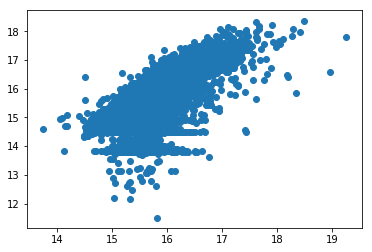

In [133]:
param_grid = {'ridge__alpha': [0.01, 0.1, 1],
             'ridge__solver': ['sag']}
pipeline_in=Pipeline([("ridge", linear_model.Ridge())])
ridge_model = ridge_regression(final_train_macro_df.drop(['timestamp', 'id','price_doc'], axis=1), 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_macro_df)
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [156]:
import statsmodels.formula.api as smf
def forward_selected(data, response):
    remaining = set(data.columns)
    remaining.remove(response)
    selected = []
    current_score, best_new_score = 0.0, 0.0
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            res = smf.ols(formula, data).fit()
            score = res.rsquared_adj
            scores_with_candidates.append((score, candidate))
            print res.summary()
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    return model

In [226]:
def col_select(unit, unit_range=1):
    x= pd.concat([final_train_macro_df[final_train_macro_df.columns[unit:unit+unit_range]], final_train_macro_df['price_doc_tr'], final_train_macro_df['oil_rub']], axis=1)
    try:
        x = x.drop(['timestamp', 'rent_price_4+room_bus'], axis=1)
        x = x.drop(['price_doc'], axis=1)
    except:
        try:
            x = x.drop(['timestamp'], axis=1)
            x = x.drop(['price_doc'], axis=1)
        except:
            try:
                x = x.drop(['rent_price_4+room_bus'], axis=1)
                x = x.drop(['price_doc'], axis=1)
            except:
                try:
                    x = x.drop(['price_doc'], axis=1)
                except:
                    pass
    return x
                      
                      
                      
                      
                      

In [196]:
print final_train_macro_df.shape

(30471, 154)


In [197]:
forward_selected(col_select(0, 110), 'price_doc_tr')

                            OLS Regression Results                            
Dep. Variable:           price_doc_tr   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     514.6
Date:                Sat, 27 May 2017   Prob (F-statistic):          5.52e-113
Time:                        16:23:46   Log-Likelihood:                -27636.
No. Observations:               30471   AIC:                         5.528e+04
Df Residuals:                   30469   BIC:                         5.529e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       15.5865      0.004   4354.871   

In [203]:
flr_model = forward_selected(col_select(0, 70), 'price_doc_tr')

                            OLS Regression Results                            
Dep. Variable:           price_doc_tr   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     514.6
Date:                Sat, 27 May 2017   Prob (F-statistic):          5.52e-113
Time:                        16:37:38   Log-Likelihood:                -27636.
No. Observations:               30471   AIC:                         5.528e+04
Df Residuals:                   30469   BIC:                         5.529e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       15.5865      0.004   4354.871   

In [207]:
print flr_model.model.predict(final_test_macro_df)

price_doc_tr ~ deposits_value + balance_trade_growth + micex_rgbi_tr + invest_fixed_capital_per_cap + net_capital_export + profitable_enterpr_share + usdrub + gdp_quart + mortgage_rate + oil_urals + mortgage_value + brent + 1


In [221]:
cols = ['deposits_value', 'balance_trade_growth' , 'micex_rgbi_tr' , 'invest_fixed_capital_per_cap' , 'net_capital_export' , 'profitable_enterpr_share' , 'usdrub', 'gdp_quart' , 'mortgage_rate' , 'oil_urals' , 'mortgage_value' , 'brent', 'price_doc_tr']
cols_test = ['deposits_value', 'balance_trade_growth' , 'micex_rgbi_tr' , 'invest_fixed_capital_per_cap' , 'net_capital_export' , 'profitable_enterpr_share' , 'usdrub', 'gdp_quart' , 'mortgage_rate' , 'oil_urals' , 'mortgage_value' , 'brent']


In [220]:
final_train_macro_df[cols]

,deposits_value,balance_trade_growth,micex_rgbi_tr,invest_fixed_capital_per_cap,net_capital_export,profitable_enterpr_share,usdrub,gdp_quart,mortgage_rate,oil_urals,mortgage_value,brent,price_doc_tr
0,-0.928895,-0.389836,0.299787,-1.188697,1.370876,0.631494,-0.781301,-0.861475,-1.249227,0.829950,-0.449966,0.757906,15.581952
1,-0.928895,-0.389836,0.340706,-1.188697,1.370876,0.631494,-0.784788,-0.861475,-1.249227,0.829950,-0.449966,0.783516,15.607270
2,-0.928895,-0.389836,0.288499,-1.188697,1.370876,0.631494,-0.794410,-0.861475,-1.249227,0.829950,-0.449966,0.859604,15.555977
3,-0.907470,-0.389836,0.340706,-1.188697,2.554370,0.631494,-0.783922,-0.861475,-1.127248,0.901889,-0.289994,0.968355,16.388123
4,-0.865611,-0.389836,0.304020,-1.188697,2.554370,0.631494,-0.750782,-0.861475,-1.127248,0.901889,-0.289994,0.812095,16.608603
5,-0.865611,-0.389836,0.311075,-1.188697,2.554370,0.631494,-0.737107,-0.861475,-1.127248,0.901889,-0.289994,0.916392,16.023785
6,-0.865611,-0.389836,0.335062,-1.188697,2.554370,0.631494,-0.739587,-0.861475,-1.127248,0.901889,-0.289994,0.978005,15.520259
7,-0.865611,-0.389836,0.323774,-1.188697,2.554370,0.631494,-0.711642,-0.861475,-1.127248,0.901889,-0.289994,0.911938,14.508658
8,-0.865611,-0.389836,0.323774,-1.188697,2.554370,0.631494,-0.711642,-0.861475,-1.127248,0.901889,-0.289994,0.911938,15.483218
9,-0.865611,-0.389836,0.304020,-1.188697,2.554370,0.631494,-0.699453,-0.861475,-1.127248,0.901889,-0.289994,0.879276,14.508658


# Simple lin reg: macro+train on front half cols

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.0s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.0s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.0s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.0s
[CV] linreg__fit_intercept=True ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


[CV] ............................. linreg__fit_intercept=True -   0.0s

 All grid results: 

[mean: 0.00143, std: 0.00101, params: {'linreg__fit_intercept': True}]

20170527-164648: Best score ridge: 0.00142666392948


20170527-164648: Best parameters ridge: {'linreg__fit_intercept': True}



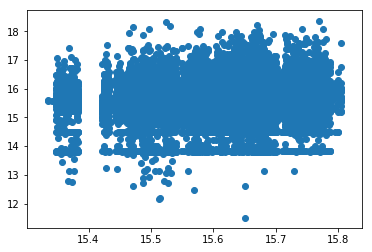

In [222]:
param_grid = {'linreg__fit_intercept': [True]}
pipeline_in=Pipeline([("linreg", linear_model.LinearRegression())])
ridge_model = ridge_regression(final_train_macro_df[cols], 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_macro_df[cols_test])
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [227]:
flr_model = forward_selected(col_select(90, 63), 'price_doc_tr')

                            OLS Regression Results                            
Dep. Variable:           price_doc_tr   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     494.6
Date:                Sat, 27 May 2017   Prob (F-statistic):          1.06e-108
Time:                        16:59:42   Log-Likelihood:                -27646.
No. Observations:               30471   AIC:                         5.530e+04
Df Residuals:                   30469   BIC:                         5.531e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              15.6094    

In [230]:
flr_model.model.formula

'price_doc_tr ~ full_sq + sadovoe_km + yearmonth + swim_pool_km + state + floor + radiation_km + nuclear_reactor_km + metro_min_avto + num_room + ice_rink_km + theater_km + green_zone_km + mosque_km + year + kitch_sq + fitness_km + park_km + water_km + apartment_build + industrial_km + cemetery_km + material + office_sqm_500 + green_part_500 + hospital_beds_raion + hospice_morgue_km + school_km + balance_trade_shift_91 + railroad_km + water_treatment_km + preschool_quota + theaters_viewers_per_1000_cap + month_year_cnt + usdeur + brent_rub + church_synagogue_km + oil_rub_shift_153 + 1'

In [233]:
cols2 = ['full_sq' ,'sadovoe_km', 'swim_pool_km' ,'state' , 'floor' , 'radiation_km' , 'nuclear_reactor_km' , 'metro_min_avto' , 'num_room' , 'ice_rink_km' , 'theater_km' , 'green_zone_km' , 'mosque_km' , 'year' , 'kitch_sq' , 'fitness_km' , 'park_km' , 'water_km' , 'apartment_build', 'industrial_km' , 'cemetery_km' , 'material' , 'office_sqm_500' , 'green_part_500' , 'hospital_beds_raion' , 'hospice_morgue_km' , 'school_km', 'balance_trade_shift_91' , 'railroad_km' , 'water_treatment_km' , 'preschool_quota' , 'theaters_viewers_per_1000_cap' , 'month_year_cnt' , 'usdeur' , 'brent_rub' , 'church_synagogue_km' , 'oil_rub_shift_153', 'price_doc_tr']
cols2_test = ['full_sq' ,'sadovoe_km', 'swim_pool_km' ,'state' , 'floor' , 'radiation_km' , 'nuclear_reactor_km' , 'metro_min_avto' , 'num_room' , 'ice_rink_km' , 'theater_km' , 'green_zone_km' , 'mosque_km' , 'year' , 'kitch_sq' , 'fitness_km' , 'park_km' , 'water_km' , 'apartment_build', 'industrial_km' , 'cemetery_km' , 'material' , 'office_sqm_500' , 'green_part_500' , 'hospital_beds_raion' , 'hospice_morgue_km' , 'school_km', 'balance_trade_shift_91' , 'railroad_km' , 'water_treatment_km' , 'preschool_quota' , 'theaters_viewers_per_1000_cap' , 'month_year_cnt' , 'usdeur' , 'brent_rub' , 'church_synagogue_km' , 'oil_rub_shift_153']



# Simple lin reg: macro+train on back half cols

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s

 All grid results: 

[mean: 0.34789, std: 0.07464, params: {'linreg__fit_intercept': True}]

20170527-171215: Best score ridge: 0.347894283413


20170527-171215: Best parameters ridge: {'linreg__fit_intercept': True}



[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished


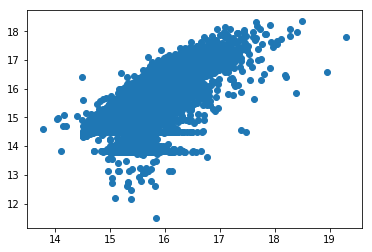

In [234]:
param_grid = {'linreg__fit_intercept': [True]}
pipeline_in=Pipeline([("linreg", linear_model.LinearRegression())])
ridge_model = ridge_regression(final_train_macro_df[cols2], 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_macro_df[cols2_test])
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [238]:
cols3 = cols2 + ['deposits_value', 'balance_trade_growth' , 'micex_rgbi_tr']
cols3_test = cols2_test + ['deposits_value', 'balance_trade_growth' , 'micex_rgbi_tr']

# Simple lin reg: macro+train on combined set of columns

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s
[CV] linreg__fit_intercept=True ......................................
[CV] ............................. linreg__fit_intercept=True -   0.1s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished



 All grid results: 

[mean: 0.34914, std: 0.07338, params: {'linreg__fit_intercept': True}]

20170527-171554: Best score ridge: 0.349142628515


20170527-171554: Best parameters ridge: {'linreg__fit_intercept': True}



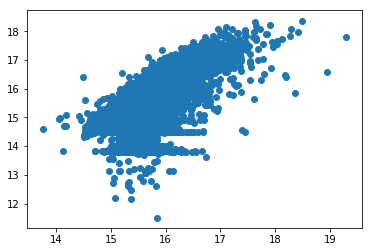

In [239]:
param_grid = {'linreg__fit_intercept': [True]}
pipeline_in=Pipeline([("linreg", linear_model.LinearRegression())])
ridge_model = ridge_regression(final_train_macro_df[cols3], 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_macro_df[cols3_test])
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [240]:
predictions.head()

,id,price_doc
0,30474,4.547859e+06
1,30475,8.093775e+06
2,30476,4.807119e+06
3,30477,5.901816e+06
4,30478,4.561378e+06


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] ridge__alpha=0.0001 .............................................
[CV] .................................... ridge__alpha=0.0001 -   0.1s
[CV] ridge__alpha=0.0001 .............................................
[CV] .................................... ridge__alpha=0.0001 -   0.1s
[CV] ridge__alpha=0.0001 .............................................
[CV] .................................... ridge__alpha=0.0001 -   0.0s
[CV] ridge__alpha=0.0001 .............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] .................................... ridge__alpha=0.0001 -   0.0s
[CV] ridge__alpha=0.0001 .............................................
[CV] .................................... ridge__alpha=0.0001 -   0.1s
[CV] ridge__alpha=0.000120450354026 ..................................
[CV] ......................... ridge__alpha=0.000120450354026 -   0.0s
[CV] ridge__alpha=0.000120450354026 ..................................
[CV] ......................... ridge__alpha=0.000120450354026 -   0.0s
[CV] ridge__alpha=0.000120450354026 ..................................
[CV] ......................... ridge__alpha=0.000120450354026 -   0.0s
[CV] ridge__alpha=0.000120450354026 ..................................
[CV] ......................... ridge__alpha=0.000120450354026 -   0.0s
[CV] ridge__alpha=0.000120450354026 ..................................
[CV] ......................... ridge__alpha=0.000120450354026 -   0.0s
[CV] ridge__alpha=0.00014508287785 ...................................
[CV] .

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   29.3s finished



 All grid results: 

[mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.0001}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00012045035402587823}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00014508287784959401}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00017475284000076829}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00021049041445120198}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00025353644939701115}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00030538555088334158}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00036783797718286342}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.0004430621457583882}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00053366992312063122}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00064280731172843193}, mean: 0.34914, std: 0.07338, params: {'ridge__alpha': 0.00077426368268112698}, mean: 0.34914, std: 0.07338, params: {'ridge__

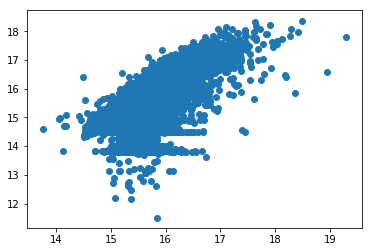

In [242]:
param_grid = {'ridge__alpha': np.logspace(-4,4,100)}
pipeline_in=Pipeline([("ridge", linear_model.Ridge())])
ridge_model = ridge_regression(final_train_macro_df[cols3], 'price_doc_tr', param=param_grid,pipeline_in=pipeline_in)
y_pred = ridge_model.predict(final_test_macro_df[cols3_test])
y_pred_final = np.exp(y_pred)-1
predictions = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': y_pred_final})

In [333]:
predictions.to_csv('./data/linreg_pred.csv', index=False)
#Kaggle score = 0.36882

In [308]:
xgb_pred = pd.read_csv('/Users/samo/Downloads/sub.csv')
xgb_pred2 = pd.read_csv('./logs/predictions/russian_housing_submission_20170526-232704.csv')

In [314]:
def weighted_avg(unit):
    return (unit*xgb_pred2.ix[:,1]+predictions.ix[:,1])/(unit+1)

In [327]:
[np.mean(weighted_avg(x/100.)/xgb_pred.ix[:,1]) for x in range(230, 235)]
#x = 2.305 is optimal value for 0.975 reproduction

[0.9749668985303648,
 0.9750544032557974,
 0.9751413808443196,
 0.9752278360449274,
 0.9753137735497225]

In [328]:
predictions_final = pd.DataFrame({ 'id': final_test_df['id'],'price_doc': weighted_avg(2.305)})

In [329]:
predictions_final.to_csv('./logs/predictions/lrxgb2.csv', index = False)
#Kaggle score = 0.31837

# Conclusions

## Lin reg doesn't work as well as xgb, could use it in a stacking model with train data

## Macro adds extra 0.02 to R^2, not worth the overfit risk
## Recommend using ridge with small alpha or standard multilin reg